# Problem 25.1

In [ ]:
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

In [ ]:
def f(x):
    if x < 0:
        f = 0.
    else: 
        f = np.exp(-x)
    
    return f

def MCMC(p, n, sigma):
    x = np.zeros(n)
    
    # initialize first choice using random uniform
    init = np.random.uniform()
    x[0] = p(init)
    
    for i in tqdm(range(n-1)):
        y = x[i] + sigma*np.random.normal(0,1)
            
        # generate acceptance probability
        accept = min(1, (p(y)/p(x[i])))
        test = np.random.uniform()
        if (test < accept): # if a random number is less than acceptance probability, then accept
            x[i+1] = y
        else:
            x[i+1] = x[i]
                
    return x
    
def kxx(x):
    c = 0.
    for i in range(len(x)-1):
        c += (x[i] - 1)*(x[i+1] - 1)
    c = c/len(x)
    return c

In [ ]:
# This is just a test to check that function simulates a Markov Chain for sigma = 1
x = MCMC(f, 2000000, 1)
plt.hist(x, bins = 200)

In [ ]:
# Generate list of sigmas from which we find the optimal sigma that yields minimal 1-step autocovariance
sigmas = np.logspace(-1,1,40)
autocor = np.zeros(40)
for i in tqdm(range(40)):
    y = MCMC(f, 2000000, sigmas[i])
    autocor[i] = kxx(y)
    
plt.plot(sigmas, autocor, '.')
plt.show()

# Problem 25.2

In [3]:
import numpy as np
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt

In [3]:
# generate L x L torus
def glauber(L,T): # uses glauber dynamidcs to create list of images that can be used to create a gif as well as average magnetization
   
    grid = np.ones((L,L))
    savedlist = []
    avg = np.absolute(np.sum(grid))/(L**2)
    
    for k in tqdm(range(10000000)):

        i, j = np.random.randint(0,L), np.random.randint(0,L) # randomly select indices
       
        og = np.copy(grid[i,j])

        S = np.copy(grid[(i-1)%L, j]) + np.copy(grid[(i+1)%L,j]) + np.copy(grid[i, (j+1)%L]) + np.copy(grid[i,(j-1)%L])  #evaluate neighbors on torus
        change = np.exp(-og*S/T)/(np.exp(S/T) + np.exp(-S/T))
       
        test = np.random.uniform()
 
       
        if (test < change): # if sampled probability less than acceptance, then switch sign of grid entry
            grid[i,j] = -np.copy(og)
            
        avg += np.absolute(np.sum(grid))/(L**2)
        
        if (k%1000 == 0):
            im = Image.fromarray((255*grid).astype(np.uint8), mode = 'P')
            savedlist.append(im)
            
    avg = avg/10000000
           
    return savedlist, avg

In [ ]:
# This is not part of the problem, but this is used to generate a GIF file (titled "glauber.gif") to visualize the simulation
ising = glauber(32, 2.6)
grid, avg = ising[0], ising[1]
grid[0].save('glauber.gif',
               save_all = True, append_images = grid[1:],
               optimize = False, duration = 10)

In [5]:
# Generate list of t-values and L-values to find average magnetization
Tvalues = np.linspace(2, 2.6, 10)
Lvalues = [32, 64, 128]

avgvalues32 = []
for j in tqdm(Tvalues):
    ising = glauber(32, j)
    avgvalues32.append(ising[1])
            
avgvalues64 = []
for j in tqdm(Tvalues):
    ising = glauber(64, j)
    avgvalues64.append(ising[1])

avgvalues128 = []
for j in tqdm(Tvalues):
    ising = glauber(128, j)
    avgvalues128.append(ising[1])

  6%|▌         | 600485/10000000 [00:27<10:16, 15240.25it/s]


 11%|█         | 1101291/10000000 [00:54<05:52, 25222.53it/s]


 17%|█▋        | 1656769/10000000 [01:21<09:12, 15111.20it/s]


 21%|██        | 2108612/10000000 [01:49<05:30, 23876.05it/s]


 27%|██▋       | 2656236/10000000 [02:15<07:57, 15388.81it/s]


 31%|███       | 3071271/10000000 [02:43<05:04, 22763.52it/s]


 36%|███▋      | 3635680/10000000 [03:09<05:59, 17722.77it/s]


 40%|████      | 4044197/10000000 [03:37<04:06, 24209.06it/s]


 46%|████▌     | 4619735/10000000 [04:04<05:39, 15826.09it/s]


 50%|████▉     | 4956768/10000000 [04:31<07:41, 10939.44it/s]


 56%|█████▌    | 5551683/10000000 [04:58<03:11, 23243.71it/s]


 59%|█████▉    | 5938789/10000000 [05:25<07:11, 9409.36it/s]


 65%|██████▌   | 6525680/10000000 [05:52<03:11, 18140.06it/s]


 69%|██████▉   | 6938221/10000000 [06:19<03:53, 13113.94it/s]


 75%|███████▍  | 7473739/10000000 [06:46<01:50, 22898.76it/s]


 79%|███████▉  | 7897035/10000000 [07:13<02:35, 13540.75it/s]


 84%|████████▍ | 8438365/10000000 [07:40<01:03, 24443.46it/s]


 89%|████████▉ | 8893706/10000000 [08:08<01:38, 11211.69it/s]


 94%|█████████▍| 9400699/10000000 [08:35<00:25, 23075.58it/s]


 99%|█████████▉| 9895761/10000000 [09:01<00:08, 11884.52it/s]


  4%|▍         | 375009/10000000 [00:17<07:10, 22336.31it/s]


  9%|▉         | 879875/10000000 [00:44<08:54, 17078.59it/s]


 13%|█▎        | 1342249/10000000 [01:12<09:07, 15802.77it/s]


 18%|█▊        | 1849012/10000000 [01:39<08:54, 15238.66it/s]


 23%|██▎       | 2291358/10000000 [02:06<05:55, 21699.99it/s]


 28%|██▊       | 2826578/10000000 [02:33<08:08, 14669.75it/s]


 33%|███▎      | 3276661/10000000 [03:00<05:41, 19689.75it/s]


 38%|███▊      | 3833446/10000000 [03:27<06:01, 17076.21it/s]


 43%|████▎     | 4281248/10000000 [03:54<03:54, 24389.77it/s]


 49%|████▊     | 4859188/10000000 [04:21<05:23, 15912.83it/s]


 53%|█████▎    | 5276671/10000000 [04:48<03:35, 21956.17it/s]


 59%|█████▊    | 5864386/10000000 [05:15<03:53, 17687.21it/s]


 63%|██████▎   | 6290191/10000000 [05:42<02:39, 23278.79it/s]


 69%|██████▊   | 6867914/10000000 [06:10<03:11, 16322.96it/s]


 73%|███████▎  | 7254220/10000000 [06:37<01:53, 24158.55it/s]


 79%|███████▊  | 7870595/10000000 [07:04<03:02, 11659.10it/s]


 82%|████████▏ | 8246648/10000000 [07:31<02:21, 12376.95it/s]


 88%|████████▊ | 8847705/10000000 [07:58<00:57, 19906.42it/s]


 92%|█████████▏| 9236168/10000000 [08:26<01:01, 12350.15it/s]


 99%|█████████▊| 9859264/10000000 [08:52<00:05, 24514.51it/s]


  3%|▎         | 275147/10000000 [00:20<11:47, 13752.33it/s]


  9%|▊         | 874504/10000000 [00:47<06:35, 23046.80it/s]


 13%|█▎        | 1312424/10000000 [01:14<16:32, 8753.51it/s]


 19%|█▉        | 1892688/10000000 [01:41<05:54, 22855.47it/s]


 24%|██▎       | 2359345/10000000 [02:08<10:00, 12726.47it/s]


 29%|██▉       | 2912695/10000000 [02:34<04:57, 23804.40it/s]


 34%|███▍      | 3375157/10000000 [03:01<10:18, 10713.14it/s]


 39%|███▉      | 3877377/10000000 [03:29<04:08, 24677.96it/s]


 44%|████▎     | 4373313/10000000 [03:56<10:15, 9145.13it/s]


 49%|████▉     | 4880644/10000000 [04:23<03:40, 23236.15it/s]


 54%|█████▍    | 5390729/10000000 [04:50<04:48, 15967.72it/s]


 59%|█████▉    | 5875779/10000000 [05:17<03:19, 20692.01it/s]


 64%|██████▍   | 6414632/10000000 [05:43<03:19, 17970.70it/s]


 69%|██████▉   | 6895265/10000000 [06:11<02:18, 22426.04it/s]


 74%|███████▍  | 7422815/10000000 [06:38<04:20, 9896.81it/s]


 79%|███████▉  | 7880387/10000000 [07:05<01:26, 24447.96it/s]


 84%|████████▍ | 8423450/10000000 [07:31<01:42, 15351.81it/s]


 89%|████████▊ | 8870332/10000000 [07:59<00:46, 24266.56it/s]


 94%|█████████▍| 9446205/10000000 [08:26<00:38, 14423.50it/s]


 99%|█████████▊| 9862696/10000000 [08:53<00:05, 24481.46it/s]


  5%|▍         | 452786/10000000 [00:21<09:29, 16759.49it/s]


  9%|▉         | 885824/10000000 [00:49<08:40, 17506.04it/s]


 15%|█▍        | 1475658/10000000 [01:15<08:35, 16522.96it/s]


 19%|█▊        | 1866885/10000000 [01:42<05:35, 24236.46it/s]


 25%|██▍       | 2468605/10000000 [02:09<10:15, 12236.33it/s]


 29%|██▊       | 2851611/10000000 [02:36<05:51, 20351.82it/s]


 35%|███▍      | 3463011/10000000 [03:03<04:26, 24554.48it/s]


 39%|███▊      | 3850517/10000000 [03:30<10:12, 10042.93it/s]


 45%|████▍     | 4476786/10000000 [03:57<03:49, 24115.49it/s]


 49%|████▉     | 4891679/10000000 [04:24<05:58, 14232.12it/s]


 55%|█████▍    | 5475631/10000000 [04:51<03:16, 23044.36it/s]


 59%|█████▉    | 5922285/10000000 [05:18<04:42, 14444.21it/s]


 65%|██████▍   | 6476951/10000000 [05:45<02:45, 21322.88it/s]


 69%|██████▉   | 6921393/10000000 [06:12<06:44, 7614.37it/s]


 75%|███████▍  | 7466518/10000000 [06:39<01:45, 24108.40it/s]


 80%|███████▉  | 7962310/10000000 [07:06<03:00, 11301.50it/s]


 85%|████████▍ | 8466131/10000000 [07:33<01:06, 23089.65it/s]


 90%|████████▉ | 8975261/10000000 [07:59<01:10, 14568.65it/s]


 95%|█████████▍| 9457001/10000000 [08:27<00:22, 24261.81it/s]


100%|█████████▉| 9979945/10000000 [08:54<00:01, 15047.31it/s]


  5%|▍         | 461328/10000000 [00:26<10:06, 15728.94it/s]


 10%|▉         | 999655/10000000 [00:53<09:41, 15469.72it/s]


 14%|█▍        | 1447837/10000000 [01:20<06:20, 22461.71it/s]


 20%|█▉        | 1972865/10000000 [01:47<09:03, 14773.89it/s]


 24%|██▍       | 2430799/10000000 [02:14<05:26, 23197.37it/s]


 30%|██▉       | 2985228/10000000 [02:41<08:13, 14209.11it/s]


 34%|███▍      | 3412022/10000000 [03:08<04:34, 24014.82it/s]


 40%|███▉      | 3986737/10000000 [03:35<06:31, 15344.26it/s]


 44%|████▍     | 4406843/10000000 [04:02<03:51, 24117.98it/s]


 50%|████▉     | 4989674/10000000 [04:29<05:38, 14820.34it/s]


 54%|█████▍    | 5389786/10000000 [04:56<03:13, 23788.13it/s]


 60%|█████▉    | 5991658/10000000 [05:23<04:32, 14714.57it/s]


 64%|██████▍   | 6386826/10000000 [05:50<02:41, 22330.69it/s]


 70%|██████▉   | 6996433/10000000 [06:17<02:04, 24134.99it/s]


 74%|███████▍  | 7378551/10000000 [06:44<02:10, 20040.68it/s]


 80%|███████▉  | 7971397/10000000 [07:11<01:23, 24223.59it/s]


 84%|████████▎ | 8370557/10000000 [07:38<03:00, 9015.28it/s] 


 90%|████████▉ | 8950878/10000000 [08:05<00:46, 22788.39it/s]


 94%|█████████▍| 9377036/10000000 [08:32<00:46, 13261.06it/s]


 99%|█████████▉| 9916119/10000000 [08:59<00:04, 17704.99it/s]


  4%|▎         | 372995/10000000 [00:23<19:25, 8262.02it/s]


  9%|▉         | 903403/10000000 [00:51<07:18, 20751.72it/s]


 14%|█▍        | 1379599/10000000 [01:18<11:30, 12488.66it/s]


 19%|█▊        | 1868878/10000000 [01:45<06:17, 21550.51it/s]


 23%|██▎       | 2341800/10000000 [02:12<08:45, 14569.00it/s]


 28%|██▊       | 2798086/10000000 [02:39<05:55, 20245.85it/s]


 33%|███▎      | 3309709/10000000 [03:06<07:51, 14179.02it/s]


 38%|███▊      | 3774850/10000000 [03:33<04:30, 23042.62it/s]


 43%|████▎     | 4291048/10000000 [04:00<05:40, 16781.57it/s]


 47%|████▋     | 4748529/10000000 [04:27<05:02, 17349.45it/s]


 53%|█████▎    | 5282454/10000000 [04:54<04:36, 17078.67it/s]


 57%|█████▋    | 5734990/10000000 [05:21<03:03, 23296.18it/s]


 63%|██████▎   | 6260001/10000000 [05:48<05:41, 10957.43it/s]


 67%|██████▋   | 6669896/10000000 [06:15<02:26, 22750.36it/s]


 72%|███████▏  | 7163052/10000000 [06:43<03:45, 12597.18it/s]


 75%|███████▌  | 7542534/10000000 [07:10<01:51, 21963.41it/s]


 81%|████████  | 8114534/10000000 [07:36<02:08, 14721.92it/s]


 84%|████████▍ | 8388166/10000000 [08:04<04:49, 5563.93it/s]


 88%|████████▊ | 8750837/10000000 [08:31<00:59, 20887.19it/s]


 91%|█████████▏| 9145207/10000000 [08:58<00:56, 15086.67it/s]


 95%|█████████▌| 9507679/10000000 [09:25<00:22, 21707.96it/s]


  0%|          | 31797/10000000 [00:02<12:27, 13335.09it/s]


  4%|▍         | 404028/10000000 [00:29<11:19, 14116.48it/s]


  9%|▉         | 947155/10000000 [00:57<09:35, 15729.74it/s]


 13%|█▎        | 1261706/10000000 [01:24<09:50, 14797.63it/s]


 18%|█▊        | 1777233/10000000 [01:51<07:32, 18155.88it/s]


 22%|██▏       | 2150663/10000000 [02:18<13:57, 9377.20it/s]


 26%|██▋       | 2626318/10000000 [02:45<05:37, 21858.99it/s]


 31%|███       | 3056981/10000000 [03:12<10:29, 11027.23it/s]


 35%|███▌      | 3526117/10000000 [03:39<04:40, 23093.64it/s]


 40%|████      | 4015904/10000000 [04:05<07:18, 13661.51it/s]


 45%|████▍     | 4466731/10000000 [04:32<03:49, 24063.98it/s]


 50%|████▉     | 4979824/10000000 [04:59<05:21, 15623.87it/s]


 54%|█████▍    | 5407264/10000000 [05:26<03:32, 21657.09it/s]


 59%|█████▉    | 5934301/10000000 [05:53<04:18, 15698.28it/s]


 64%|██████▎   | 6353936/10000000 [06:20<02:36, 23306.44it/s]


 69%|██████▉   | 6909748/10000000 [06:47<03:18, 15546.26it/s]


 73%|███████▎  | 7300798/10000000 [07:14<02:07, 21090.99it/s]


 79%|███████▉  | 7885925/10000000 [07:41<02:33, 13785.73it/s]


 83%|████████▎ | 8251822/10000000 [08:08<01:27, 19913.02it/s]


 88%|████████▊ | 8837496/10000000 [08:34<00:52, 22054.27it/s]


 92%|█████████▏| 9235581/10000000 [09:02<01:31, 8382.14it/s]


 98%|█████████▊| 9805294/10000000 [09:28<00:08, 22117.64it/s]


  2%|▏         | 218658/10000000 [00:16<18:32, 8792.52it/s]


  8%|▊         | 761338/10000000 [00:44<06:47, 22660.88it/s]


 12%|█▏        | 1197842/10000000 [01:11<17:08, 8558.90it/s]


 17%|█▋        | 1718320/10000000 [01:37<07:14, 19048.96it/s]


 22%|██▏       | 2186656/10000000 [02:04<10:55, 11911.48it/s]


 27%|██▋       | 2658885/10000000 [02:31<05:13, 23404.29it/s]


 32%|███▏      | 3155642/10000000 [02:58<08:42, 13095.40it/s]


 36%|███▌      | 3589166/10000000 [03:25<04:32, 23526.97it/s]


 41%|████      | 4108931/10000000 [03:52<05:43, 17129.17it/s]


 45%|████▌     | 4535617/10000000 [04:19<04:06, 22143.29it/s]


 51%|█████     | 5063337/10000000 [04:46<05:32, 14846.53it/s]


 55%|█████▍    | 5488922/10000000 [05:13<03:34, 21032.61it/s]


 60%|██████    | 6041419/10000000 [05:40<03:51, 17107.66it/s]


 64%|██████▍   | 6421627/10000000 [06:07<02:36, 22854.67it/s]


 70%|██████▉   | 6991315/10000000 [06:33<03:05, 16220.28it/s]


 74%|███████▎  | 7360372/10000000 [07:00<01:51, 23657.56it/s]


 79%|███████▉  | 7935495/10000000 [07:27<01:43, 19967.15it/s]


 83%|████████▎ | 8303439/10000000 [07:54<03:51, 7313.27it/s]


 89%|████████▊ | 8859698/10000000 [08:21<00:50, 22759.01it/s]


 93%|█████████▎| 9251833/10000000 [08:48<01:41, 7390.70it/s]


 98%|█████████▊| 9778950/10000000 [09:15<00:11, 19685.85it/s]


  2%|▏         | 211013/10000000 [00:15<12:20, 13221.56it/s]


  7%|▋         | 733301/10000000 [00:43<06:38, 23270.65it/s]


 12%|█▏        | 1182026/10000000 [01:10<13:19, 11032.82it/s]


 17%|█▋        | 1676869/10000000 [01:37<06:33, 21176.17it/s]


 22%|██▏       | 2158326/10000000 [02:03<08:13, 15896.40it/s]


 26%|██▌       | 2604835/10000000 [02:30<05:30, 22354.00it/s]


 31%|███       | 3110467/10000000 [02:57<07:45, 14807.08it/s]


 35%|███▌      | 3543126/10000000 [03:24<04:33, 23594.71it/s]


 41%|████      | 4073094/10000000 [03:51<05:59, 16485.35it/s]


 45%|████▍     | 4485560/10000000 [04:18<03:54, 23544.72it/s]


 50%|█████     | 5036063/10000000 [04:45<05:52, 14079.21it/s]


 54%|█████▍    | 5416233/10000000 [05:12<03:15, 23451.86it/s]


 60%|█████▉    | 5987482/10000000 [05:38<04:02, 16568.17it/s]


 64%|██████▎   | 6356148/10000000 [06:05<02:42, 22491.73it/s]


 69%|██████▉   | 6932143/10000000 [06:32<02:08, 23925.09it/s]


 73%|███████▎  | 7307436/10000000 [06:59<05:00, 8960.83it/s]


 78%|███████▊  | 7848799/10000000 [07:26<01:36, 22210.65it/s]


 83%|████████▎ | 8258339/10000000 [07:53<02:18, 12538.38it/s]


 88%|████████▊ | 8779294/10000000 [08:20<01:23, 14555.65it/s]


 92%|█████████▏| 9210499/10000000 [08:47<01:13, 10778.10it/s]


 97%|█████████▋| 9687608/10000000 [09:14<00:13, 22575.95it/s]


  2%|▏         | 163962/10000000 [00:11<13:12, 12405.32it/s]


  6%|▋         | 633296/10000000 [00:38<07:43, 20193.25it/s]


 11%|█▏        | 1126165/10000000 [01:05<09:56, 14878.23it/s]


 15%|█▌        | 1537680/10000000 [01:32<06:01, 23433.74it/s]


 21%|██        | 2071181/10000000 [01:59<08:29, 15569.10it/s]


 25%|██▍       | 2482086/10000000 [02:26<05:44, 21825.29it/s]


 30%|███       | 3019272/10000000 [02:53<06:45, 17219.07it/s]


 34%|███▍      | 3405739/10000000 [03:20<05:05, 21604.95it/s]


 40%|███▉      | 3954977/10000000 [03:47<06:30, 15485.92it/s]


 43%|████▎     | 4311056/10000000 [04:14<04:19, 21924.09it/s]


 49%|████▉     | 4897539/10000000 [04:40<03:53, 21819.58it/s]


 53%|█████▎    | 5266115/10000000 [05:07<05:19, 14833.81it/s]


 58%|█████▊    | 5819983/10000000 [05:34<02:56, 23648.38it/s]


 62%|██████▏   | 6220933/10000000 [06:01<06:48, 9261.44it/s] 


 67%|██████▋   | 6727760/10000000 [06:28<02:25, 22483.84it/s]


 72%|███████▏  | 7167702/10000000 [06:55<05:17, 8931.76it/s] 


 77%|███████▋  | 7661563/10000000 [07:22<02:41, 14522.60it/s]


 81%|████████  | 8117390/10000000 [07:49<02:29, 12574.35it/s]


 86%|████████▌ | 8583405/10000000 [08:16<01:04, 22058.72it/s]


 91%|█████████ | 9068839/10000000 [08:42<01:29, 10369.83it/s]


 95%|█████████▌| 9510973/10000000 [09:09<00:25, 18987.74it/s]


  0%|          | 12642/10000000 [00:00<10:28, 15888.23it/s]


  4%|▍         | 440216/10000000 [00:28<07:22, 21607.71it/s]


 10%|▉         | 975080/10000000 [00:54<10:57, 13736.00it/s]


 14%|█▎        | 1372073/10000000 [01:21<06:44, 21323.36it/s]


 19%|█▉        | 1905348/10000000 [01:48<08:46, 15372.32it/s]


 23%|██▎       | 2274341/10000000 [02:15<05:47, 22223.61it/s]


 28%|██▊       | 2820661/10000000 [02:41<05:37, 21265.20it/s]


 32%|███▏      | 3175200/10000000 [03:08<16:47, 6774.75it/s]


 37%|███▋      | 3699532/10000000 [03:34<05:06, 20548.30it/s]


 41%|████      | 4084633/10000000 [04:01<14:31, 6789.40it/s]


 46%|████▌     | 4570225/10000000 [04:28<04:07, 21919.11it/s]


 50%|█████     | 5027148/10000000 [04:54<07:19, 11326.02it/s]


 55%|█████▍    | 5462338/10000000 [05:21<03:33, 21294.51it/s]


 59%|█████▉    | 5941086/10000000 [05:47<04:58, 13585.82it/s]


 64%|██████▎   | 6351834/10000000 [06:14<02:36, 23265.97it/s]


 69%|██████▊   | 6861371/10000000 [06:41<03:25, 15301.79it/s]


 72%|███████▏  | 7240627/10000000 [07:08<02:29, 18426.40it/s]


 78%|███████▊  | 7782546/10000000 [07:34<02:41, 13729.86it/s]


 81%|████████▏ | 8140871/10000000 [08:01<01:24, 21962.84it/s]


 87%|████████▋ | 8694682/10000000 [08:27<01:11, 18257.09it/s]


 91%|█████████ | 9070758/10000000 [08:54<01:12, 12879.17it/s]


 96%|█████████▌| 9592987/10000000 [09:20<00:19, 21405.15it/s]


100%|█████████▉| 9991557/10000000 [09:47<00:01, 5716.04it/s]


  5%|▍         | 486165/10000000 [00:25<07:45, 20432.86it/s]


  9%|▉         | 935243/10000000 [00:52<12:09, 12433.17it/s]


 14%|█▍        | 1382848/10000000 [01:19<06:32, 21941.80it/s]


 19%|█▊        | 1860507/10000000 [01:46<09:48, 13830.41it/s]


 23%|██▎       | 2278104/10000000 [02:13<05:41, 22612.42it/s]


 28%|██▊       | 2782790/10000000 [02:39<09:11, 13074.87it/s]


 32%|███▏      | 3165408/10000000 [03:06<05:34, 20405.09it/s]


 37%|███▋      | 3670059/10000000 [03:33<07:35, 13894.03it/s]


 40%|███▉      | 3997570/10000000 [04:00<04:55, 20333.29it/s]


 45%|████▌     | 4521844/10000000 [04:26<04:21, 20920.47it/s]


 49%|████▉     | 4875922/10000000 [04:53<06:19, 13512.31it/s]


 54%|█████▍    | 5385602/10000000 [05:20<03:40, 20907.29it/s]


 58%|█████▊    | 5800473/10000000 [05:46<10:16, 6810.54it/s]


 63%|██████▎   | 6257004/10000000 [06:13<03:09, 19782.26it/s]


 67%|██████▋   | 6712255/10000000 [06:40<03:40, 14888.49it/s]


 71%|███████▏  | 7145022/10000000 [07:06<02:15, 21103.06it/s]


 76%|███████▌  | 7610064/10000000 [07:33<02:35, 15382.35it/s]


 80%|███████▉  | 7995074/10000000 [08:00<01:33, 21510.54it/s]


 85%|████████▍ | 8487568/10000000 [08:27<01:55, 13092.10it/s]


 88%|████████▊ | 8782659/10000000 [08:54<00:58, 20861.33it/s]


 93%|█████████▎| 9317404/10000000 [09:20<00:42, 16131.62it/s]


 97%|█████████▋| 9658294/10000000 [09:47<00:51, 6678.93it/s]


  2%|▏         | 183518/10000000 [00:09<07:48, 20965.34it/s]


  6%|▌         | 580789/10000000 [00:36<13:55, 11275.20it/s]


 11%|█         | 1080998/10000000 [01:02<06:49, 21758.39it/s]


 15%|█▌        | 1508557/10000000 [01:29<11:59, 11809.57it/s]


 19%|█▉        | 1934329/10000000 [01:56<06:37, 20283.58it/s]


 24%|██▍       | 2404264/10000000 [02:22<08:25, 15033.84it/s]


 28%|██▊       | 2808756/10000000 [02:49<05:33, 21548.27it/s]


 33%|███▎      | 3300702/10000000 [03:16<07:31, 14846.37it/s]


 37%|███▋      | 3673925/10000000 [03:43<04:56, 21365.85it/s]


 42%|████▏     | 4187935/10000000 [04:09<07:31, 12859.79it/s]


 45%|████▌     | 4528665/10000000 [04:36<04:11, 21724.42it/s]


 51%|█████     | 5076118/10000000 [05:02<03:41, 22206.67it/s]


 54%|█████▍    | 5427142/10000000 [05:29<06:32, 11648.69it/s]


 59%|█████▉    | 5938475/10000000 [05:56<03:19, 20400.52it/s]


 63%|██████▎   | 6336943/10000000 [06:22<09:10, 6654.43it/s]


 68%|██████▊   | 6799167/10000000 [06:49<02:31, 21178.33it/s]


 72%|███████▏  | 7231149/10000000 [07:16<03:32, 13009.58it/s]


 77%|███████▋  | 7651090/10000000 [07:43<01:50, 21243.75it/s]


 81%|████████  | 8116613/10000000 [08:09<02:26, 12822.02it/s]


 85%|████████▌ | 8520348/10000000 [08:36<01:11, 20674.54it/s]


 90%|█████████ | 9028809/10000000 [09:03<01:06, 14525.61it/s]


 94%|█████████▍| 9402151/10000000 [09:30<00:26, 22431.77it/s]


 99%|█████████▉| 9915031/10000000 [09:56<00:05, 14198.75it/s]


  3%|▎         | 269545/10000000 [00:21<08:10, 19820.08it/s]


  8%|▊         | 806619/10000000 [00:47<07:11, 21329.74it/s]


 12%|█▏        | 1160479/10000000 [01:15<21:41, 6789.68it/s]


 17%|█▋        | 1672502/10000000 [01:41<06:34, 21132.75it/s]


 21%|██        | 2056870/10000000 [02:08<19:28, 6797.33it/s]


 25%|██▌       | 2514362/10000000 [02:34<05:37, 22149.98it/s]


 30%|██▉       | 2961350/10000000 [03:01<07:44, 15148.82it/s]


 34%|███▍      | 3380212/10000000 [03:28<05:12, 21183.52it/s]


 38%|███▊      | 3844316/10000000 [03:54<07:32, 13611.78it/s]


 42%|████▏     | 4241633/10000000 [04:22<05:00, 19152.94it/s]


 47%|████▋     | 4734017/10000000 [04:48<05:50, 15018.71it/s]


 51%|█████     | 5091902/10000000 [05:15<03:51, 21170.52it/s]


 56%|█████▌    | 5623706/10000000 [05:41<04:24, 16529.69it/s]


 60%|█████▉    | 5953467/10000000 [06:08<04:33, 14804.11it/s]


 65%|██████▍   | 6483208/10000000 [06:35<02:55, 20091.74it/s]


 69%|██████▊   | 6861918/10000000 [07:01<03:56, 13273.09it/s]


 73%|███████▎  | 7336050/10000000 [07:28<02:11, 20316.68it/s]


 78%|███████▊  | 7753546/10000000 [07:55<03:35, 10427.48it/s]


 82%|████████▏ | 8192118/10000000 [08:22<01:32, 19545.78it/s]


 86%|████████▋ | 8638710/10000000 [08:48<01:44, 12990.20it/s]


 90%|█████████ | 9031498/10000000 [09:15<00:45, 21233.52it/s]


 95%|█████████▌| 9524297/10000000 [09:42<00:37, 12578.59it/s]


 99%|█████████▉| 9883547/10000000 [10:09<00:05, 20381.03it/s]


  4%|▍         | 399359/10000000 [00:20<10:23, 15387.21it/s]


  8%|▊         | 751910/10000000 [00:48<09:51, 15623.80it/s]


 13%|█▎        | 1256953/10000000 [01:15<07:46, 18755.28it/s]


 16%|█▌        | 1582966/10000000 [01:42<21:15, 6598.79it/s]


 21%|██        | 2087791/10000000 [02:08<09:31, 13852.96it/s]


 25%|██▍       | 2484918/10000000 [02:35<19:47, 6326.34it/s]


 29%|██▉       | 2942333/10000000 [03:01<05:40, 20711.94it/s]


 34%|███▍      | 3393554/10000000 [03:28<10:36, 10383.07it/s]


 38%|███▊      | 3791269/10000000 [03:55<04:49, 21433.47it/s]


 43%|████▎     | 4261428/10000000 [04:22<07:03, 13559.46it/s]


 46%|████▋     | 4632076/10000000 [04:49<06:09, 14515.97it/s]


 51%|█████▏    | 5131914/10000000 [05:15<04:49, 16813.61it/s]


 55%|█████▍    | 5477850/10000000 [05:42<03:51, 19541.89it/s]


 60%|██████    | 6004120/10000000 [06:08<06:17, 10590.33it/s]


 63%|██████▎   | 6335498/10000000 [06:35<03:27, 17694.67it/s]


 69%|██████▊   | 6854202/10000000 [07:02<02:42, 19382.67it/s]


 72%|███████▏  | 7225033/10000000 [07:28<05:22, 8595.07it/s]


 77%|███████▋  | 7692464/10000000 [07:55<01:52, 20599.75it/s]


 81%|████████  | 8114541/10000000 [08:22<02:59, 10487.69it/s]


 85%|████████▌ | 8527135/10000000 [08:49<01:51, 13159.50it/s]


 90%|████████▉ | 8983047/10000000 [09:15<01:06, 15308.42it/s]


 94%|█████████▎| 9358693/10000000 [09:42<00:33, 18944.78it/s]


 98%|█████████▊| 9848943/10000000 [10:08<00:14, 10617.36it/s]


  2%|▏         | 217679/10000000 [00:15<07:36, 21446.05it/s]


  7%|▋         | 738524/10000000 [00:42<10:15, 15047.00it/s]


 11%|█         | 1064220/10000000 [01:10<09:45, 15267.65it/s]


 16%|█▌        | 1580834/10000000 [01:36<06:43, 20865.84it/s]


 19%|█▉        | 1929935/10000000 [02:03<16:49, 7990.89it/s]


 24%|██▍       | 2419059/10000000 [02:29<06:56, 18196.04it/s]


 28%|██▊       | 2829356/10000000 [02:56<11:08, 10719.49it/s]


 32%|███▏      | 3246608/10000000 [03:23<05:31, 20395.94it/s]


 37%|███▋      | 3683753/10000000 [03:49<08:12, 12813.65it/s]


 41%|████      | 4090700/10000000 [04:16<04:38, 21214.93it/s]


 46%|████▌     | 4560714/10000000 [04:43<06:11, 14626.06it/s]


 49%|████▉     | 4929337/10000000 [05:10<04:13, 20001.69it/s]


 54%|█████▍    | 5427153/10000000 [05:36<05:08, 14841.29it/s]


 58%|█████▊    | 5754164/10000000 [06:03<03:41, 19190.60it/s]


 63%|██████▎   | 6269914/10000000 [06:30<03:19, 18685.68it/s]


 66%|██████▌   | 6608285/10000000 [06:57<07:52, 7176.71it/s]


 71%|███████   | 7101378/10000000 [07:23<02:18, 21000.88it/s]


 75%|███████▍  | 7478899/10000000 [07:50<05:47, 7249.45it/s]


 80%|███████▉  | 7951179/10000000 [08:16<01:39, 20635.64it/s]


 84%|████████▍ | 8381246/10000000 [08:43<02:14, 12062.24it/s]


 88%|████████▊ | 8789217/10000000 [09:10<01:00, 19977.35it/s]


 92%|█████████▏| 9246585/10000000 [09:36<01:00, 12493.08it/s]


 96%|█████████▌| 9622877/10000000 [10:03<00:19, 18922.32it/s]


  1%|          | 100562/10000000 [00:07<14:43, 11210.94it/s]


  4%|▍         | 445632/10000000 [00:34<09:35, 16592.62it/s]


  9%|▉         | 945256/10000000 [01:01<10:33, 14286.71it/s]


 13%|█▎        | 1278535/10000000 [01:28<07:18, 19905.52it/s]


 18%|█▊        | 1804176/10000000 [01:54<06:43, 20295.74it/s]


 22%|██▏       | 2150345/10000000 [02:21<09:57, 13140.08it/s]


 26%|██▋       | 2626829/10000000 [02:48<06:07, 20065.94it/s]


 30%|███       | 3019275/10000000 [03:15<17:49, 6529.45it/s]


 35%|███▍      | 3460972/10000000 [03:41<05:30, 19774.78it/s]


 39%|███▉      | 3883525/10000000 [04:08<07:12, 14138.58it/s]


 43%|████▎     | 4293424/10000000 [04:35<04:32, 20951.87it/s]


 47%|████▋     | 4723955/10000000 [05:02<06:29, 13542.12it/s]


 51%|█████     | 5105071/10000000 [05:29<04:03, 20116.02it/s]


 56%|█████▌    | 5592333/10000000 [05:55<05:10, 14214.25it/s]


 59%|█████▉    | 5938227/10000000 [06:22<03:32, 19108.68it/s]


 64%|██████▍   | 6434352/10000000 [06:48<04:08, 14362.44it/s]


 68%|██████▊   | 6762143/10000000 [07:16<04:42, 11455.23it/s]


 73%|███████▎  | 7255503/10000000 [07:42<02:14, 20376.17it/s]


 76%|███████▌  | 7614683/10000000 [08:09<04:25, 8995.10it/s] 


 81%|████████  | 8091611/10000000 [08:35<01:37, 19627.43it/s]


 85%|████████▍ | 8498408/10000000 [09:02<02:17, 10932.55it/s]


 89%|████████▉ | 8907255/10000000 [09:29<01:02, 17436.27it/s]


 94%|█████████▎| 9365959/10000000 [09:55<00:44, 14141.38it/s]


 97%|█████████▋| 9733549/10000000 [10:22<00:12, 21156.56it/s]


  2%|▏         | 204291/10000000 [00:13<10:42, 15252.06it/s]


  6%|▌         | 554235/10000000 [00:40<08:43, 18047.74it/s]


 11%|█         | 1063739/10000000 [01:07<09:57, 14949.62it/s]


 14%|█▍        | 1388479/10000000 [01:34<10:41, 13421.73it/s]


 19%|█▉        | 1899481/10000000 [02:00<08:28, 15938.97it/s]


 22%|██▏       | 2211253/10000000 [02:28<12:22, 10485.13it/s]


 27%|██▋       | 2658975/10000000 [02:54<06:06, 20036.79it/s]


 31%|███       | 3066860/10000000 [03:21<08:49, 13105.02it/s]


 35%|███▍      | 3460031/10000000 [03:48<05:19, 20464.67it/s]


 39%|███▉      | 3904756/10000000 [04:14<08:05, 12555.38it/s]


 43%|████▎     | 4265835/10000000 [04:41<06:36, 14453.92it/s]


 47%|████▋     | 4746972/10000000 [05:07<05:54, 14831.67it/s]


 51%|█████     | 5085909/10000000 [05:35<03:59, 20498.77it/s]


 56%|█████▌    | 5599194/10000000 [06:01<05:15, 13965.69it/s]


 59%|█████▉    | 5918900/10000000 [06:28<09:23, 7247.15it/s]


 64%|██████▍   | 6401522/10000000 [06:54<02:51, 21019.82it/s]


 68%|██████▊   | 6760776/10000000 [07:22<07:41, 7023.39it/s]


 72%|███████▏  | 7172844/10000000 [07:48<02:13, 21135.40it/s]


 76%|███████▌  | 7595150/10000000 [08:15<02:49, 14177.32it/s]


 80%|███████▉  | 7988602/10000000 [08:42<02:41, 12426.59it/s]


 85%|████████▍ | 8450646/10000000 [09:08<02:07, 12125.93it/s]


 88%|████████▊ | 8798442/10000000 [09:35<01:03, 18811.55it/s]


 93%|█████████▎| 9254812/10000000 [10:02<01:23, 8925.88it/s]


 96%|█████████▌| 9582578/10000000 [10:29<00:21, 19175.27it/s]


  1%|          | 88040/10000000 [00:04<08:02, 20560.82it/s]


  4%|▍         | 422112/10000000 [00:31<18:09, 8788.87it/s]


  9%|▉         | 911573/10000000 [00:58<07:17, 20768.16it/s]


 13%|█▎        | 1298349/10000000 [01:25<16:38, 8713.34it/s]


 17%|█▋        | 1726812/10000000 [01:52<07:30, 18382.18it/s]


 22%|██▏       | 2154523/10000000 [02:18<09:45, 13395.07it/s]


 25%|██▌       | 2546727/10000000 [02:45<05:59, 20715.30it/s]


 30%|██▉       | 2999646/10000000 [03:12<10:54, 10698.28it/s]


 34%|███▎      | 3361980/10000000 [03:39<05:44, 19281.20it/s]


 38%|███▊      | 3841410/10000000 [04:05<06:59, 14674.57it/s]


 42%|████▏     | 4171228/10000000 [04:32<04:56, 19636.41it/s]


 47%|████▋     | 4686983/10000000 [04:59<04:32, 19523.75it/s]


 50%|█████     | 5026177/10000000 [05:26<06:46, 12235.22it/s]


 55%|█████▌    | 5510055/10000000 [05:52<03:48, 19608.79it/s]


 59%|█████▉    | 5904419/10000000 [06:19<07:25, 9190.37it/s]


 63%|██████▎   | 6325739/10000000 [06:46<02:59, 20461.73it/s]


 68%|██████▊   | 6754854/10000000 [07:12<04:37, 11688.46it/s]


 71%|███████▏  | 7141785/10000000 [07:39<02:23, 19969.15it/s]


 76%|███████▌  | 7599922/10000000 [08:06<02:37, 15230.67it/s]


 80%|███████▉  | 7957438/10000000 [08:33<01:34, 21574.93it/s]


 85%|████████▍ | 8454237/10000000 [08:59<01:52, 13794.52it/s]


 88%|████████▊ | 8775014/10000000 [09:26<01:29, 13637.92it/s]


 93%|█████████▎| 9281780/10000000 [09:53<00:38, 18428.12it/s]


 96%|█████████▋| 9628578/10000000 [10:20<00:35, 10496.45it/s]


  1%|          | 101875/10000000 [00:05<07:48, 21143.04it/s]


  5%|▍         | 496690/10000000 [00:32<14:57, 10591.94it/s]


  9%|▉         | 937943/10000000 [00:59<07:49, 19299.36it/s]


 14%|█▎        | 1364369/10000000 [01:25<10:09, 14159.48it/s]


 17%|█▋        | 1745093/10000000 [01:53<06:45, 20375.19it/s]


 22%|██▏       | 2200632/10000000 [02:19<10:09, 12786.82it/s]


 25%|██▌       | 2534921/10000000 [02:46<06:04, 20477.84it/s]


 30%|███       | 3027321/10000000 [03:13<07:17, 15924.19it/s]


 34%|███▎      | 3356958/10000000 [03:40<06:08, 18039.11it/s]


 39%|███▊      | 3859724/10000000 [04:06<05:09, 19857.92it/s]


 42%|████▏     | 4206842/10000000 [04:33<11:50, 8147.96it/s]


 47%|████▋     | 4665583/10000000 [05:00<04:39, 19055.52it/s]


 51%|█████     | 5056806/10000000 [05:26<09:06, 9041.39it/s]


 52%|█████▏    | 5211015/10000000 [05:40<04:08, 19251.42it/s]


 57%|█████▋    | 5707840/10000000 [06:06<05:51, 12217.18it/s]


 60%|██████    | 6022621/10000000 [06:34<06:42, 9886.72it/s] 


 65%|██████▍   | 6487965/10000000 [07:00<03:00, 19510.78it/s]


 69%|██████▊   | 6864152/10000000 [07:27<09:30, 5497.68it/s]


 73%|███████▎  | 7307499/10000000 [07:53<02:19, 19253.21it/s]


 77%|███████▋  | 7719532/10000000 [08:20<08:24, 4519.35it/s]


 79%|███████▊  | 7855369/10000000 [08:47<06:07, 5838.37it/s]


 81%|████████  | 8050418/10000000 [09:14<04:45, 6837.71it/s]


 83%|████████▎ | 8293520/10000000 [09:41<04:19, 6579.51it/s]


 85%|████████▍ | 8471540/10000000 [10:08<02:52, 8880.33it/s]


 87%|████████▋ | 8714978/10000000 [10:35<02:39, 8074.42it/s]


 89%|████████▉ | 8949096/10000000 [11:02<03:26, 5085.54it/s]


 93%|█████████▎| 9333719/10000000 [11:29<00:35, 18688.62it/s]


 97%|█████████▋| 9667867/10000000 [11:55<00:34, 9749.81it/s] 


100%|█████████▉| 9990744/10000000 [12:23<00:00, 16303.03it/s]


  4%|▎         | 361571/10000000 [00:26<12:57, 12404.54it/s]


  7%|▋         | 675293/10000000 [00:53<11:45, 13221.54it/s]


 11%|█         | 1093133/10000000 [01:20<11:52, 12492.18it/s]


 14%|█▍        | 1376324/10000000 [01:47<12:00, 11961.92it/s]


 18%|█▊        | 1813553/10000000 [02:13<11:17, 12081.10it/s]


 21%|██        | 2118589/10000000 [02:40<21:42, 6050.54it/s]


 25%|██▌       | 2533975/10000000 [03:07<06:31, 19081.54it/s]


 29%|██▉       | 2892283/10000000 [03:33<17:21, 6822.81it/s]


 33%|███▎      | 3263283/10000000 [04:00<06:34, 17074.98it/s]


 36%|███▋      | 3647533/10000000 [04:27<07:35, 13958.57it/s]


 40%|████      | 4010577/10000000 [04:53<07:16, 13720.85it/s]


 44%|████▍     | 4427399/10000000 [05:20<07:10, 12938.01it/s]


 48%|████▊     | 4763758/10000000 [05:47<04:48, 18178.57it/s]


 52%|█████▏    | 5197685/10000000 [06:13<05:58, 13411.76it/s]


 55%|█████▌    | 5509968/10000000 [06:40<04:06, 18198.47it/s]


 60%|█████▉    | 5966705/10000000 [07:06<04:55, 13660.03it/s]


 63%|██████▎   | 6262617/10000000 [07:33<07:33, 8233.10it/s]


 67%|██████▋   | 6718175/10000000 [07:59<03:17, 16639.75it/s]


 71%|███████   | 7052560/10000000 [08:26<04:30, 10885.46it/s]


 75%|███████▍  | 7471281/10000000 [08:52<02:24, 17502.33it/s]


 78%|███████▊  | 7822118/10000000 [09:19<03:38, 9954.47it/s] 


 81%|████████  | 8090492/10000000 [09:46<01:46, 18012.34it/s]


 86%|████████▌ | 8552241/10000000 [10:12<02:13, 10841.55it/s]


 88%|████████▊ | 8845200/10000000 [10:39<01:54, 10119.50it/s]


 93%|█████████▎| 9303884/10000000 [11:06<00:38, 18095.66it/s]


 96%|█████████▋| 9640847/10000000 [11:32<00:35, 10169.30it/s]


  0%|          | 47624/10000000 [00:02<09:14, 17944.73it/s]


  4%|▍         | 421372/10000000 [00:29<16:18, 9791.12it/s] 


  8%|▊         | 808756/10000000 [00:57<09:53, 15480.12it/s]


 12%|█▏        | 1204462/10000000 [01:23<11:02, 13277.34it/s]


 16%|█▌        | 1558090/10000000 [01:50<07:52, 17851.68it/s]


 20%|█▉        | 1975517/10000000 [02:16<11:42, 11423.82it/s]


 23%|██▎       | 2300747/10000000 [02:43<07:02, 18232.07it/s]


 27%|██▋       | 2743198/10000000 [03:09<08:44, 13824.85it/s]


 31%|███       | 3055459/10000000 [03:36<06:22, 18136.72it/s]


 35%|███▌      | 3511254/10000000 [04:02<05:50, 18515.13it/s]


 38%|███▊      | 3811448/10000000 [04:29<16:01, 6437.99it/s]


 43%|████▎     | 4256141/10000000 [04:56<04:59, 19168.54it/s]


 46%|████▌     | 4593336/10000000 [05:22<11:17, 7979.89it/s]


 50%|█████     | 5000488/10000000 [05:49<04:43, 17655.93it/s]


 54%|█████▍    | 5379472/10000000 [06:15<07:45, 9934.89it/s]


 57%|█████▋    | 5738399/10000000 [06:42<04:00, 17733.07it/s]


 61%|██████▏   | 6146174/10000000 [07:08<05:13, 12296.57it/s]


 65%|██████▍   | 6490639/10000000 [07:35<03:10, 18392.80it/s]


 69%|██████▉   | 6917028/10000000 [08:02<04:20, 11830.05it/s]


 72%|███████▏  | 7228315/10000000 [08:29<02:34, 17994.65it/s]


 77%|███████▋  | 7675236/10000000 [08:55<03:07, 12408.93it/s]


 80%|███████▉  | 7970609/10000000 [09:22<01:52, 18094.42it/s]


 84%|████████▍ | 8425143/10000000 [09:48<01:25, 18449.60it/s]


 87%|████████▋ | 8746220/10000000 [10:15<03:21, 6234.89it/s]


 92%|█████████▏| 9170553/10000000 [10:41<00:45, 18184.94it/s]


 95%|█████████▌| 9537848/10000000 [11:07<00:46, 9870.50it/s] 


 99%|█████████▉| 9918367/10000000 [11:34<00:04, 19315.41it/s]


  3%|▎         | 314294/10000000 [00:21<12:45, 12657.54it/s]


  6%|▋         | 649915/10000000 [00:49<09:13, 16897.14it/s]


 11%|█         | 1060638/10000000 [01:15<11:28, 12987.61it/s]


 14%|█▎        | 1367018/10000000 [01:42<07:45, 18555.24it/s]


 18%|█▊        | 1768159/10000000 [02:09<10:47, 12715.65it/s]


 21%|██        | 2068737/10000000 [02:36<07:58, 16569.96it/s]


 25%|██▌       | 2508271/10000000 [03:02<07:57, 15675.06it/s]


 28%|██▊       | 2801413/10000000 [03:29<13:16, 9037.89it/s]


 32%|███▏      | 3217403/10000000 [03:56<06:44, 16750.63it/s]


 36%|███▌      | 3562467/10000000 [04:22<11:43, 9151.14it/s]


 39%|███▉      | 3895909/10000000 [04:49<05:54, 17203.24it/s]


 43%|████▎     | 4276196/10000000 [05:15<07:17, 13085.10it/s]


 46%|████▌     | 4582302/10000000 [05:42<05:05, 17738.53it/s]


 50%|████▉     | 4983706/10000000 [06:09<06:48, 12280.29it/s]


 53%|█████▎    | 5282064/10000000 [06:36<05:13, 15042.16it/s]


 57%|█████▋    | 5703033/10000000 [07:02<05:43, 12523.51it/s]


 60%|█████▉    | 5971785/10000000 [07:29<06:37, 10122.50it/s]


 64%|██████▍   | 6403524/10000000 [07:56<03:30, 17089.48it/s]


 67%|██████▋   | 6706363/10000000 [08:23<09:19, 5886.71it/s]


 71%|███████   | 7083955/10000000 [08:49<02:46, 17516.40it/s]


 74%|███████▍  | 7444418/10000000 [09:16<06:48, 6261.05it/s]


 78%|███████▊  | 7770864/10000000 [09:43<02:14, 16630.00it/s]


 81%|████████  | 8112257/10000000 [10:10<02:27, 12755.54it/s]


 84%|████████▍ | 8405559/10000000 [10:38<02:38, 10078.40it/s]


 88%|████████▊ | 8824415/10000000 [11:04<01:36, 12182.05it/s]


 91%|█████████ | 9104465/10000000 [11:31<01:14, 11943.49it/s]


 95%|█████████▌| 9544933/10000000 [11:57<00:33, 13523.65it/s]


 98%|█████████▊| 9841264/10000000 [12:24<00:20, 7747.69it/s]


  2%|▏         | 245598/10000000 [00:14<09:12, 17647.79it/s]


  6%|▌         | 600228/10000000 [00:41<19:49, 7901.08it/s]


 10%|▉         | 963628/10000000 [01:08<09:01, 16689.68it/s]


 13%|█▎        | 1330312/10000000 [01:35<13:27, 10736.39it/s]


 17%|█▋        | 1652502/10000000 [02:02<09:07, 15232.94it/s]


 21%|██        | 2053395/10000000 [02:29<11:26, 11576.78it/s]


 24%|██▎       | 2355836/10000000 [02:55<07:43, 16475.01it/s]


 28%|██▊       | 2781696/10000000 [03:22<13:16, 9056.92it/s]


 31%|███       | 3066089/10000000 [03:49<07:55, 14592.83it/s]


 35%|███▌      | 3504456/10000000 [04:15<06:03, 17875.37it/s]


 38%|███▊      | 3814910/10000000 [04:41<14:36, 7057.02it/s]


 42%|████▏     | 4201128/10000000 [05:08<05:27, 17704.57it/s]


 45%|████▌     | 4548658/10000000 [05:35<09:22, 9693.29it/s]


 49%|████▉     | 4901078/10000000 [06:02<07:32, 11261.48it/s]


 53%|█████▎    | 5279951/10000000 [06:28<06:55, 11348.14it/s]


 56%|█████▌    | 5559359/10000000 [06:55<06:21, 11630.33it/s]


 58%|█████▊    | 5836240/10000000 [07:22<09:34, 7252.05it/s]


 60%|██████    | 6016808/10000000 [07:49<12:21, 5371.09it/s]


 63%|██████▎   | 6267386/10000000 [08:16<03:47, 16429.62it/s]


 66%|██████▌   | 6567226/10000000 [08:42<07:15, 7875.92it/s]


 68%|██████▊   | 6835914/10000000 [09:09<03:35, 14692.99it/s]


 72%|███████▏  | 7190879/10000000 [09:36<04:06, 11416.52it/s]


 74%|███████▍  | 7422989/10000000 [10:03<09:22, 4580.29it/s]


 78%|███████▊  | 7806060/10000000 [10:29<02:18, 15824.88it/s]


 81%|████████  | 8099933/10000000 [10:56<03:25, 9254.44it/s]


 84%|████████▍ | 8430959/10000000 [11:23<01:52, 13918.00it/s]


 88%|████████▊ | 8788116/10000000 [11:49<01:44, 11639.62it/s]


 91%|█████████ | 9084113/10000000 [12:16<00:52, 17521.08it/s]


 95%|█████████▍| 9468803/10000000 [12:43<00:50, 10580.76it/s]


 98%|█████████▊| 9759556/10000000 [13:10<00:14, 16832.01it/s]


  2%|▏         | 195294/10000000 [00:12<12:15, 13329.84it/s]


  5%|▍         | 475897/10000000 [00:39<13:44, 11546.60it/s]


  9%|▉         | 924915/10000000 [01:06<08:54, 16994.40it/s]


 12%|█▏        | 1233768/10000000 [01:33<12:49, 11398.18it/s]


 16%|█▋        | 1630435/10000000 [01:59<07:45, 17985.46it/s]


 20%|█▉        | 1997703/10000000 [02:26<11:45, 11338.78it/s]


 23%|██▎       | 2347504/10000000 [02:52<07:44, 16477.35it/s]


 27%|██▋       | 2738187/10000000 [03:19<10:02, 12052.09it/s]


 31%|███       | 3054690/10000000 [03:46<06:38, 17426.93it/s]


 35%|███▍      | 3473246/10000000 [04:12<09:21, 11631.36it/s]


 37%|███▋      | 3747591/10000000 [04:39<10:53, 9566.08it/s]


 42%|████▏     | 4190489/10000000 [05:06<05:28, 17662.08it/s]


 45%|████▍     | 4490374/10000000 [05:33<14:01, 6547.87it/s]


 49%|████▉     | 4894397/10000000 [05:59<04:59, 17053.14it/s]


 52%|█████▏    | 5233744/10000000 [06:25<08:32, 9296.89it/s]


 56%|█████▌    | 5576840/10000000 [06:53<04:17, 17155.10it/s]


 60%|█████▉    | 5950100/10000000 [07:19<06:20, 10631.29it/s]


 63%|██████▎   | 6282435/10000000 [07:46<03:33, 17377.05it/s]


 67%|██████▋   | 6686892/10000000 [08:12<05:06, 10792.16it/s]


 70%|██████▉   | 6972035/10000000 [08:39<02:49, 17821.40it/s]


 74%|███████▍  | 7404219/10000000 [09:05<03:34, 12104.05it/s]


 77%|███████▋  | 7678659/10000000 [09:32<05:41, 6793.66it/s]


 81%|████████  | 8099041/10000000 [09:58<01:54, 16585.27it/s]


 84%|████████▍ | 8416400/10000000 [10:25<02:57, 8898.07it/s]


 88%|████████▊ | 8794216/10000000 [10:52<01:11, 16756.62it/s]


 91%|█████████▏| 9148497/10000000 [11:18<01:21, 10477.63it/s]


 95%|█████████▍| 9493055/10000000 [11:45<00:30, 16727.44it/s]


 99%|█████████▉| 9880841/10000000 [12:11<00:09, 12585.72it/s]


  2%|▏         | 189630/10000000 [00:15<10:05, 16195.64it/s]


  6%|▌         | 614547/10000000 [00:42<12:43, 12297.73it/s]


  9%|▉         | 899901/10000000 [01:09<08:57, 16933.92it/s]


 13%|█▎        | 1336125/10000000 [01:36<10:35, 13635.76it/s]


 16%|█▌        | 1619001/10000000 [02:02<13:37, 10257.29it/s]


 20%|██        | 2022916/10000000 [02:29<07:29, 17754.43it/s]


 24%|██▎       | 2358035/10000000 [02:56<14:07, 9018.53it/s]


 27%|██▋       | 2728445/10000000 [03:22<07:17, 16603.07it/s]


 31%|███       | 3094714/10000000 [03:49<10:12, 11277.29it/s]


 34%|███▍      | 3406040/10000000 [04:16<06:21, 17265.75it/s]


 38%|███▊      | 3802345/10000000 [04:42<08:28, 12191.36it/s]


 41%|████      | 4102452/10000000 [05:09<05:34, 17618.09it/s]


 45%|████▌     | 4527779/10000000 [05:36<07:27, 12216.34it/s]


 48%|████▊     | 4807835/10000000 [06:03<06:36, 13099.98it/s]


 52%|█████▏    | 5231587/10000000 [06:29<04:49, 16488.84it/s]


 55%|█████▌    | 5531938/10000000 [06:56<07:58, 9330.23it/s]


 59%|█████▉    | 5927454/10000000 [07:22<03:48, 17822.80it/s]


 63%|██████▎   | 6273774/10000000 [07:49<05:26, 11413.54it/s]


 66%|██████▌   | 6591763/10000000 [08:16<03:24, 16694.29it/s]


 70%|██████▉   | 6978742/10000000 [08:42<04:19, 11639.66it/s]


 73%|███████▎  | 7283403/10000000 [09:09<02:36, 17384.80it/s]


 77%|███████▋  | 7691868/10000000 [09:35<03:27, 11103.69it/s]


 80%|███████▉  | 7974640/10000000 [10:02<02:01, 16617.15it/s]


 84%|████████▍ | 8401886/10000000 [10:29<01:32, 17214.39it/s]


 87%|████████▋ | 8690070/10000000 [10:56<03:13, 6765.10it/s]


 91%|█████████ | 9092398/10000000 [11:22<00:59, 15260.39it/s]


 94%|█████████▍| 9420543/10000000 [11:49<01:03, 9156.38it/s]


 98%|█████████▊| 9765495/10000000 [12:16<00:14, 15678.94it/s]


  1%|▏         | 141093/10000000 [00:11<13:35, 12085.40it/s]


  5%|▍         | 480347/10000000 [00:39<09:30, 16686.87it/s]


  9%|▉         | 883668/10000000 [01:05<13:26, 11302.77it/s]


 12%|█▏        | 1179623/10000000 [01:33<08:23, 17511.48it/s]


 16%|█▌        | 1596228/10000000 [01:59<12:05, 11579.11it/s]


 19%|█▊        | 1870212/10000000 [02:26<08:55, 15175.63it/s]


 23%|██▎       | 2312280/10000000 [02:52<07:35, 16874.85it/s]


 26%|██▌       | 2614538/10000000 [03:19<11:18, 10880.07it/s]


 30%|██▉       | 2994406/10000000 [03:45<06:50, 17064.40it/s]


 33%|███▎      | 3347963/10000000 [04:12<08:54, 12434.84it/s]


 37%|███▋      | 3690660/10000000 [04:39<06:22, 16489.60it/s]


 41%|████      | 4082433/10000000 [05:05<08:43, 11314.15it/s]


 44%|████▍     | 4397054/10000000 [05:32<05:07, 18244.95it/s]


 48%|████▊     | 4807648/10000000 [05:59<06:55, 12504.51it/s]


 51%|█████     | 5090380/10000000 [06:26<04:50, 16890.29it/s]


 55%|█████▌    | 5531417/10000000 [06:52<04:09, 17919.11it/s]


 58%|█████▊    | 5826363/10000000 [07:19<08:56, 7779.84it/s]


 62%|██████▏   | 6227200/10000000 [07:45<03:51, 16315.52it/s]


 66%|██████▌   | 6571607/10000000 [08:12<06:21, 8997.23it/s]


 69%|██████▉   | 6918985/10000000 [08:39<02:52, 17868.65it/s]


 73%|███████▎  | 7288375/10000000 [09:05<03:49, 11820.14it/s]


 76%|███████▌  | 7610825/10000000 [09:32<02:23, 16609.57it/s]


 80%|███████▉  | 7999236/10000000 [09:58<03:08, 10616.33it/s]


 83%|████████▎ | 8282309/10000000 [10:25<01:47, 15957.42it/s]


 87%|████████▋ | 8708462/10000000 [10:51<01:48, 11901.52it/s]


 90%|████████▉ | 8979418/10000000 [11:18<02:59, 5683.81it/s]


 94%|█████████▍| 9387546/10000000 [11:45<00:40, 15192.13it/s]


 97%|█████████▋| 9698180/10000000 [12:11<00:54, 5521.46it/s]


  1%|          | 62152/10000000 [00:03<09:18, 17787.60it/s]


  4%|▍         | 425327/10000000 [00:30<14:17, 11172.12it/s]


  8%|▊         | 770686/10000000 [00:57<08:43, 17631.14it/s]


 11%|█         | 1124716/10000000 [01:24<13:09, 11235.33it/s]


 14%|█▍        | 1419537/10000000 [01:52<08:35, 16650.37it/s]


 18%|█▊        | 1824803/10000000 [02:18<11:32, 11798.31it/s]


 21%|██        | 2097675/10000000 [02:45<08:59, 14645.16it/s]


 25%|██▌       | 2517072/10000000 [03:11<07:19, 17014.88it/s]


 28%|██▊       | 2820139/10000000 [03:38<10:48, 11075.05it/s]


 32%|███▏      | 3199467/10000000 [04:05<06:41, 16917.94it/s]


 35%|███▌      | 3541133/10000000 [04:31<10:41, 10064.65it/s]


 39%|███▉      | 3887793/10000000 [04:58<05:46, 17618.23it/s]


 43%|████▎     | 4256404/10000000 [05:24<07:57, 12028.59it/s]


 45%|████▌     | 4543806/10000000 [05:52<05:53, 15452.37it/s]


 49%|████▉     | 4933452/10000000 [06:18<07:34, 11159.67it/s]


 52%|█████▏    | 5179855/10000000 [06:46<09:44, 8248.30it/s]


 56%|█████▌    | 5583744/10000000 [07:12<04:55, 14923.73it/s]


 59%|█████▊    | 5867687/10000000 [07:40<10:26, 6593.43it/s]


 62%|██████▏   | 6247441/10000000 [08:06<03:38, 17147.88it/s]


 66%|██████▌   | 6578492/10000000 [08:33<05:41, 10012.82it/s]


 69%|██████▉   | 6924863/10000000 [09:00<04:44, 10793.87it/s]


 73%|███████▎  | 7268925/10000000 [09:26<04:01, 11323.17it/s]


 76%|███████▌  | 7579022/10000000 [09:53<02:20, 17218.75it/s]


 80%|███████▉  | 7973171/10000000 [10:19<03:26, 9832.58it/s] 


 82%|████████▏ | 8242581/10000000 [10:47<01:52, 15604.62it/s]


 87%|████████▋ | 8655286/10000000 [11:13<01:21, 16588.58it/s]


 89%|████████▉ | 8932660/10000000 [11:40<02:20, 7617.26it/s]


 93%|█████████▎| 9324874/10000000 [12:06<00:40, 16720.43it/s]


 96%|█████████▋| 9645264/10000000 [12:32<00:38, 9254.85it/s]


100%|█████████▉| 9984286/10000000 [12:59<00:01, 15613.79it/s]


  4%|▎         | 352992/10000000 [00:25<14:51, 10819.26it/s]


  7%|▋         | 669937/10000000 [00:52<09:23, 16557.32it/s]


 11%|█         | 1069807/10000000 [01:19<17:19, 8592.61it/s]


 13%|█▎        | 1344640/10000000 [01:46<08:56, 16134.41it/s]


 18%|█▊        | 1751813/10000000 [02:13<11:28, 11975.53it/s]


 20%|██        | 2025013/10000000 [02:40<24:25, 5442.75it/s]


 24%|██▍       | 2422245/10000000 [03:06<08:24, 15015.91it/s]


 27%|██▋       | 2729232/10000000 [03:32<12:51, 9422.77it/s]


 31%|███       | 3080259/10000000 [03:59<11:02, 10451.05it/s]


 34%|███▍      | 3424871/10000000 [04:26<09:42, 11283.25it/s]


 37%|███▋      | 3736401/10000000 [04:53<06:37, 15741.41it/s]


 41%|████      | 4122326/10000000 [05:19<11:00, 8902.43it/s]


 44%|████▍     | 4405536/10000000 [05:46<05:47, 16121.68it/s]


 48%|████▊     | 4813268/10000000 [06:12<07:23, 11683.54it/s]


 51%|█████     | 5084987/10000000 [06:40<16:03, 5100.00it/s]


 55%|█████▍    | 5493421/10000000 [07:06<04:42, 15965.88it/s]


 58%|█████▊    | 5807958/10000000 [07:32<11:20, 6159.69it/s]


 62%|██████▏   | 6174225/10000000 [07:59<05:45, 11057.90it/s]


 65%|██████▌   | 6506079/10000000 [08:25<05:20, 10886.60it/s]


 68%|██████▊   | 6818981/10000000 [08:52<03:02, 17441.30it/s]


 72%|███████▏  | 7198133/10000000 [09:19<04:42, 9931.02it/s] 


 75%|███████▍  | 7482190/10000000 [09:46<02:41, 15573.66it/s]


 79%|███████▉  | 7886727/10000000 [10:12<03:00, 11699.51it/s]


 82%|████████▏ | 8155618/10000000 [10:39<06:01, 5095.81it/s]


 86%|████████▌ | 8562154/10000000 [11:05<01:31, 15787.18it/s]


 89%|████████▊ | 8874702/10000000 [11:32<02:27, 7610.23it/s]


 92%|█████████▏| 9222502/10000000 [11:59<01:00, 12778.98it/s]


 96%|█████████▌| 9562538/10000000 [12:25<00:38, 11271.05it/s]


 99%|█████████▉| 9876511/10000000 [12:52<00:07, 15990.42it/s]


  3%|▎         | 261040/10000000 [00:19<16:54, 9599.28it/s]


  5%|▌         | 547397/10000000 [00:46<15:16, 10314.71it/s]


  9%|▉         | 917260/10000000 [01:13<14:36, 10362.95it/s]


 12%|█▏        | 1183399/10000000 [01:41<11:30, 12777.13it/s]


 16%|█▌        | 1598290/10000000 [02:07<08:56, 15665.51it/s]


 19%|█▉        | 1885029/10000000 [02:34<22:22, 6046.37it/s]


 23%|██▎       | 2271786/10000000 [03:00<10:06, 12751.95it/s]


 26%|██▌       | 2593372/10000000 [03:27<12:05, 10215.92it/s]


 29%|██▉       | 2906339/10000000 [03:54<07:53, 14983.85it/s]


 33%|███▎      | 3267677/10000000 [04:20<12:26, 9015.57it/s]


 36%|███▌      | 3568669/10000000 [04:47<06:34, 16321.15it/s]


 39%|███▉      | 3946714/10000000 [05:13<08:40, 11627.43it/s]


 42%|████▏     | 4216682/10000000 [05:40<07:26, 12941.00it/s]


 46%|████▋     | 4634641/10000000 [06:06<05:29, 16305.07it/s]


 49%|████▉     | 4914528/10000000 [06:33<10:19, 8204.33it/s]


 53%|█████▎    | 5306535/10000000 [07:00<06:45, 11568.58it/s]


 56%|█████▋    | 5625224/10000000 [07:26<07:13, 10085.62it/s]


 60%|█████▉    | 5954688/10000000 [07:54<04:25, 15212.23it/s]


 63%|██████▎   | 6306748/10000000 [08:20<07:09, 8605.26it/s]


 66%|██████▌   | 6615695/10000000 [08:47<03:49, 14758.75it/s]


 70%|██████▉   | 6979017/10000000 [09:13<04:51, 10378.80it/s]


 73%|███████▎  | 7259019/10000000 [09:40<03:24, 13421.50it/s]


 77%|███████▋  | 7653760/10000000 [10:07<03:16, 11925.33it/s]


 79%|███████▉  | 7918958/10000000 [10:34<03:51, 8974.16it/s] 


 83%|████████▎ | 8304774/10000000 [11:00<02:29, 11346.54it/s]


 86%|████████▌ | 8612049/10000000 [11:26<02:48, 8216.25it/s]


 90%|████████▉ | 8953407/10000000 [11:53<01:05, 15991.46it/s]


 93%|█████████▎| 9301799/10000000 [12:19<01:22, 8420.92it/s]


 96%|█████████▌| 9618064/10000000 [12:46<00:25, 14936.84it/s]


100%|█████████▉| 9981925/10000000 [13:13<00:01, 11295.08it/s]


100%|██████████| 10/10 [2:06:23<00:00, 758.31s/it]


Text(0.5, 1.0, 'Average Magnetization for L = 32, 64, and 128')

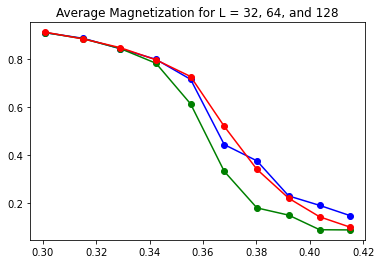

In [6]:
# Plot log T-values against average magnetizations
plt.plot(np.log10(Tvalues),avgvalues32, color = 'b', marker = 'o')
plt.plot(np.log10(Tvalues),avgvalues64, color = 'g', marker = 'o')
plt.plot(np.log10(Tvalues),avgvalues128, color = 'r', marker = 'o')
plt.title("Average Magnetization for L = 32, 64, and 128")

# Problem 25.3

In [2]:
import numpy as np
from tqdm import tqdm
import random
import matplotlib.pyplot as plt

In [4]:
# energy function
def E(x):
    E = 0.
    L = len(x)
    for i in range(L-1):
        E += x[i%(L-1)]*x[(i+1)%(L-1)]
    return -E

def gibbs(L,T): #perform Metropolis-Hastings to calculate avg energy
   
    xinit = np.zeros(L)
    
    for i in range(10): #initialized vector
        xinit[i+2] = 1
        
    avgeng = 0.
    
    for k in tqdm(range(10000000)):
        indices = random.sample(range(40), 10) # randomly select indices
        x = np.zeros(40)
        for i in indices:
            x[i] = 1.

        alpha = min(1, np.exp(-E(x)/T)/np.exp(-E(xinit)/T))
       
        test = np.random.uniform()
 
       
        if (test < alpha): # if sampled probability less than acceptance, then switch value of grid entry
            xinit = np.copy(x) #set next state as current state
            avgeng += E(x)
        else:
            avgeng += E(xinit)
            
    avgeng = avgeng/10000000
           
    return avgeng
    

In [7]:
# Generate 20 T-values from which we use to generate plot for average energies
T = np.linspace(0,2,20)
list_of_eng = []
for i in T:
    list_of_eng.append(gibbs(40, i))

  0%|          | 0/10000000 [00:00<?, ?it/s]<ipython-input-4-c2e800ad478e>:23: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = min(1, np.exp(-E(x)/T)/np.exp(-E(xinit)/T))
<ipython-input-4-c2e800ad478e>:23: RuntimeWarning: invalid value encountered in double_scalars
  alpha = min(1, np.exp(-E(x)/T)/np.exp(-E(xinit)/T))
100%|██████████| 10000000/10000000 [16:42<00:00, 9972.99it/s]


Text(0.5, 1.0, 'Plot of T values against Average Energy')

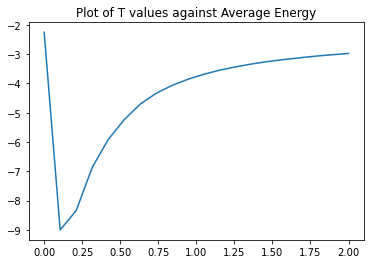

In [8]:
# Plot average energy as a function of temperature
plt.plot(T, list_of_eng)
plt.title("Plot of T values against Average Energy")